# Code for Bachelor Thesis in Economics at Heidelberg University
## by Daniel Schäffer

## Imports:

In [1]:
import matplotlib.pyplot as plt
from matplotlib.patches import Patch,Rectangle
import cartopy
import cartopy.feature as cf
import cartopy.crs as ccrs
import seaborn as sns
import folium
from folium.plugins import HeatMap, HeatMapWithTime
import cmocean
import cmocean.cm as cmo
import math

In [2]:
# #standard modules
# import pandas as pd
# import numpy as np
# import os
# import re
# #plots:
# import matplotlib.pyplot as plt
# from matplotlib.patches import Rectangle
# import cartopy
# import cartopy.feature as cf
# import cartopy.crs as ccrs
# import seaborn as sns
# import folium
# from folium.plugins import HeatMap, HeatMapWithTime
# #data
# from netCDF4 import Dataset
# from pandas import datetime
# #IO
# import openpyxl
# #speedup
# from numba import jit
# #animations
# from celluloid import Camera # getting the camera
# from IPython.display import HTML # to show the animation in Jupyter

from functions import plot_merra_data, plot_merra_data2, barplot, plot_outcome_data, plot_wind_vectorfield, plot_grid, plot_grid2,plot_wind_vectorfield2,plot_gpw_data,add_pixel2
# from functions import plot_main_dust
import os
import pickle
import numpy as np
import pandas as pd
import os
from netCDF4 import Dataset

import matplotlib as mpl
import matplotlib.pyplot as plt


from functions import process_merra_data

import statsmodels.api as sm

from numba import jit


In [3]:
mpl.font_manager._rebuild()
# Use Open Sans font family for all text.
plt.rc('font', family='Open Sans')
plt.rcParams['figure.dpi'] = 150

In [4]:
parent_directory = os.path.abspath(os.path.join(os.path.dirname(os.path.realpath("__file__")), os.pardir))

# 2. Data

## 2.1 dust data

In [5]:
#region: -20,0,25,25
#-30,-15,35,30

### Data

In [6]:
with open(parent_directory + '\\processed_data\\hourly_novapr_indices', 'rb') as pickle_file:
        hourly_novapr_indices = pickle.load(pickle_file)

with open(parent_directory + '\\processed_data\\hourly_junsep_indices', 'rb') as pickle_file:
        hourly_junsep_indices = pickle.load(pickle_file)

total_longitudes = np.load(parent_directory + '\\processed_data\\total_longitudes.npy')
total_latitudes = np.load(parent_directory + '\\processed_data\\total_latitudes.npy')

aod_monthly_data = np.load(parent_directory + '\\processed_data\\aod_monthly_data.npy')
aod_monthly_novapr_data = np.load(parent_directory + '\\processed_data\\aod_monthly_novapr_data.npy')
aod_monthly_junsep_data = np.load(parent_directory + '\\processed_data\\aod_monthly_junsep_data.npy')

west_africa_longitudes = np.load(parent_directory + '\\processed_data\\west_africa_longitudes.npy')
west_africa_latitudes = np.load(parent_directory + '\\processed_data\\west_africa_latitudes.npy')

#Dust
dust_daily_data = np.load(parent_directory + '\\processed_data\\dust_daily_data.npy')
dust_daily_data_novapr  = np.load(parent_directory + '\\processed_data\\dust_daily_data_novapr.npy')
dust_daily_data_junsep  = np.load(parent_directory + '\\processed_data\\dust_daily_data_junsep.npy')

#PM25
with open(parent_directory + '\\processed_data\\daily_novapr_indices', 'rb') as pickle_file:
        daily_novapr_indices = pickle.load(pickle_file)

with open(parent_directory + '\\processed_data\\daily_junsep_indices', 'rb') as pickle_file:
        daily_junsep_indices = pickle.load(pickle_file)

pm25_daily_data = np.load(parent_directory + '\\processed_data\\pm25_daily_data.npy')
pm25_daily_data_novapr = np.load(parent_directory + '\\processed_data\\pm25_daily_data_novapr.npy')
pm25_daily_data_junsep = np.load(parent_directory + '\\processed_data\\pm25_daily_data_junsep.npy')

bc_daily_data = np.load(parent_directory + '\\processed_data\\bc_daily_data.npy')
oc_daily_data = np.load(parent_directory + '\\processed_data\\oc_daily_data.npy')
ss_daily_data = np.load(parent_directory + '\\processed_data\\ss_daily_data.npy')
so4_daily_data = np.load(parent_directory + '\\processed_data\\so4_daily_data.npy')

so4_daily_data_novapr = np.load(parent_directory + '\\processed_data\\so4_daily_data_novapr.npy')
oc_daily_data_novapr = np.load(parent_directory + '\\processed_data\\oc_daily_data_novapr.npy')
bc_daily_data_novapr = np.load(parent_directory + '\\processed_data\\bc_daily_data_novapr.npy')
dust_daily_data_novapr = np.load(parent_directory + '\\processed_data\\dust_daily_data_novapr.npy')
ss_daily_data_novapr = np.load(parent_directory + '\\processed_data\\ss_daily_data_novapr.npy')

so4_daily_data_junsep = np.load(parent_directory + '\\processed_data\\so4_daily_data_junsep.npy')
oc_daily_data_junsep = np.load(parent_directory + '\\processed_data\\oc_daily_data_junsep.npy')
bc_daily_data_junsep = np.load(parent_directory + '\\processed_data\\bc_daily_data_junsep.npy')
dust_daily_data_junsep = np.load(parent_directory + '\\processed_data\\dust_daily_data_junsep.npy')
ss_daily_data_junsep = np.load(parent_directory + '\\processed_data\\ss_daily_data_junsep.npy')


data_total = {'composite': ['SO$_4$', 'OC', 'BC', 'DS$_{2.5}$', 'SS$_{2.5}$'],
              'value': [so4_daily_data.mean()/pm25_daily_data.mean(), oc_daily_data.mean()/pm25_daily_data.mean(),
                        bc_daily_data.mean()/pm25_daily_data.mean(), dust_daily_data.mean()/pm25_daily_data.mean(), ss_daily_data.mean()/pm25_daily_data.mean()]} 

data_junsep = {'composite': ['SO$_4$', 'OC', 'BC', 'DS$_{2.5}$', 'SS$_{2.5}$'],
              'value': [so4_daily_data_junsep.mean()/pm25_daily_data_junsep.mean(), oc_daily_data_junsep.mean()/pm25_daily_data_junsep.mean(),
                        bc_daily_data_junsep.mean()/pm25_daily_data_junsep.mean(), dust_daily_data_junsep.mean()/pm25_daily_data_junsep.mean(),
                        ss_daily_data_junsep.mean()/pm25_daily_data_junsep.mean()]}   

data_novapr = {'composite': ['SO$_4$', 'OC', 'BC', 'DS$_{2.5}$', 'SS$_{2.5}$'],
              'value': [so4_daily_data_novapr.mean()/pm25_daily_data_novapr.mean(), oc_daily_data_novapr.mean()/pm25_daily_data_novapr.mean(),
                        bc_daily_data_novapr.mean()/pm25_daily_data_novapr.mean(), dust_daily_data_novapr.mean()/pm25_daily_data_novapr.mean(),
                        ss_daily_data_novapr.mean()/pm25_daily_data_novapr.mean()]}  


  
# Create DataFrame  
data_total_df = pd.DataFrame(data_total)  
data_junsep_df = pd.DataFrame(data_junsep)  
data_novapr_df = pd.DataFrame(data_novapr)  

data_total_df['value'] = data_total_df['value']*100
data_junsep_df['value'] = data_junsep_df['value']*100
data_novapr_df['value'] = data_novapr_df['value']*100

data_total_df = data_total_df.set_index('composite')
data_junsep_df = data_junsep_df.set_index('composite')
data_novapr_df = data_novapr_df.set_index('composite')


#Wind
wind_eastward_hourly_data = np.load(parent_directory + '\\processed_data\\wind_eastward_hourly_data.npy')
wind_northward_hourly_data = np.load(parent_directory + '\\processed_data\\wind_northward_hourly_data.npy')
wind_eastward_hourly_novapr_data = np.load(parent_directory + '\\processed_data\\wind_eastward_hourly_novapr_data.npy')
wind_northward_hourly_novapr_data = np.load(parent_directory + '\\processed_data\\wind_northward_hourly_novapr_data.npy')
wind_eastward_hourly_junsep_data = np.load(parent_directory + '\\processed_data\\wind_eastward_hourly_junsep_data.npy')
wind_northward_hourly_junsep_data = np.load(parent_directory + '\\processed_data\\wind_northward_hourly_junsep_data.npy')

#Temperature
temperature_daily_data = np.load(parent_directory + '\\processed_data\\temperature_daily_data.npy')
temperature_daily_data_novapr  = np.load(parent_directory + '\\processed_data\\temperature_daily_data_novapr.npy')
temperature_daily_data_junsep  = np.load(parent_directory + '\\processed_data\\temperature_daily_data_junsep.npy')

#Precipitation
precipitation_daily_data = np.load(parent_directory + '\\processed_data\\precipitation_daily_data.npy')
precipitation_daily_data_novapr  = np.load(parent_directory + '\\processed_data\\precipitation_daily_data_novapr.npy')
precipitation_daily_data_junsep  = np.load(parent_directory + '\\processed_data\\precipitation_daily_data_junsep.npy')


#GDP Data
df_pwt = pd.read_csv(parent_directory + '\\processed_data\\df_pwt.csv')
df_pwt_growth = pd.read_csv(parent_directory + '\\processed_data\\df_pwt_growth.csv')
df_pwt_growth_per_cap = pd.read_csv(parent_directory + '\\processed_data\\df_pwt_growth_per_cap.csv')
df_pwt_per_cap = pd.read_csv(parent_directory + '\\processed_data\\df_pwt_per_cap.csv')
df_wbdi = pd.read_csv(parent_directory + '\\processed_data\\df_wbdi.csv')
df_wbdi_per_cap = pd.read_csv(parent_directory + '\\processed_data\\df_wbdi_per_cap.csv')
df_wbdi_growth = pd.read_csv(parent_directory + '\\processed_data\\df_wbdi_growth.csv')
df_wbdi_per_cap_growth = pd.read_csv(parent_directory + '\\processed_data\\df_wbdi_per_cap_growth.csv')
df_mpd = pd.read_csv(parent_directory + '\\processed_data\\df_mpd.csv')
df_mpd_growth = pd.read_csv(parent_directory + '\\processed_data\\df_mpd_growth.csv')
df_mpd_pop = pd.read_csv(parent_directory + '\\processed_data\\df_mpd_pop.csv')
df_mpd_per_cap_growth = pd.read_csv(parent_directory + '\\processed_data\\df_mpd_per_cap_growth.csv')
df_mpd_per_cap = pd.read_csv(parent_directory + '\\processed_data\\df_mpd_per_cap.csv')

#additional data

population_array = np.load(parent_directory + '\\processed_data\\population_array.npy')

benin_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_ben.csv')
burkina_faso_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_bfa.csv')
gambia_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_gmb.csv')
ghana_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_gha.csv')
guinea_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_gin.csv')
liberia_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_lbr.csv')
mali_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_mli.csv')
niger_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_ner.csv')
nigeria_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_nga.csv')
sierra_leone_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_sle.csv')
senegal_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_sen.csv')
togo_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_tgo.csv')


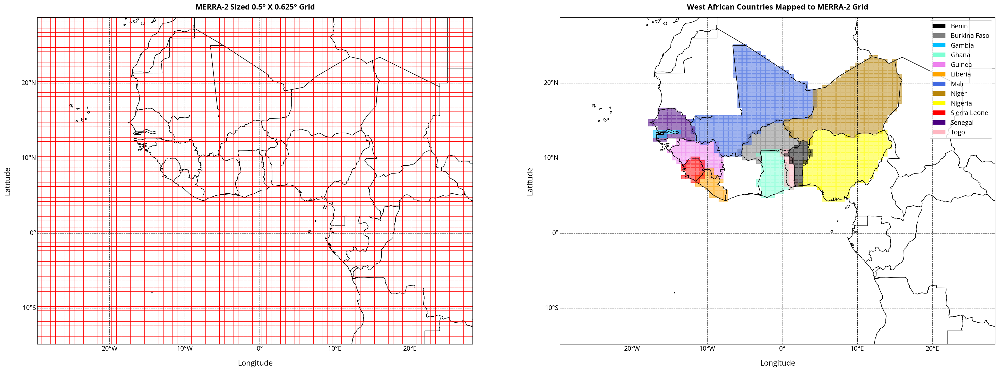

In [7]:
plot_grid2(west_africa_latitudes, west_africa_longitudes,
          ['MERRA-2 Sized 0.5° X 0.625° Grid', 'West African Countries Mapped to MERRA-2 Grid'],
          extent=[-30+(.25*1.5),29-(2*.3125),-15+(.3125/1.5),29-.25], borders = True,
          add_source_region=[False, False], plot_lines=[True,False], plot_grid_lines=[True,True], add_countries=[False,True],
          country_alpha=0.5,
          country_list=['benin', 'burkina_faso', 'gambia', 'ghana', 'guinea',
                        'liberia','mali', 'niger', 'nigeria', 'sierra_leone',
                        'senegal', 'togo'],
          country_names=['Benin', 'Burkina Faso', 'Gambia', 'Ghana', 'Guinea',
                        'Liberia','Mali', 'Niger', 'Nigeria', 'Sierra Leone',
                        'Senegal', 'Togo'],
          color_list=['black', 'grey', 'deepskyblue', 'aquamarine', 'violet',
                      'orange', 'royalblue', 'darkgoldenrod', 'yellow', 'red',
                      'indigo', 'lightpink'])

### Plots

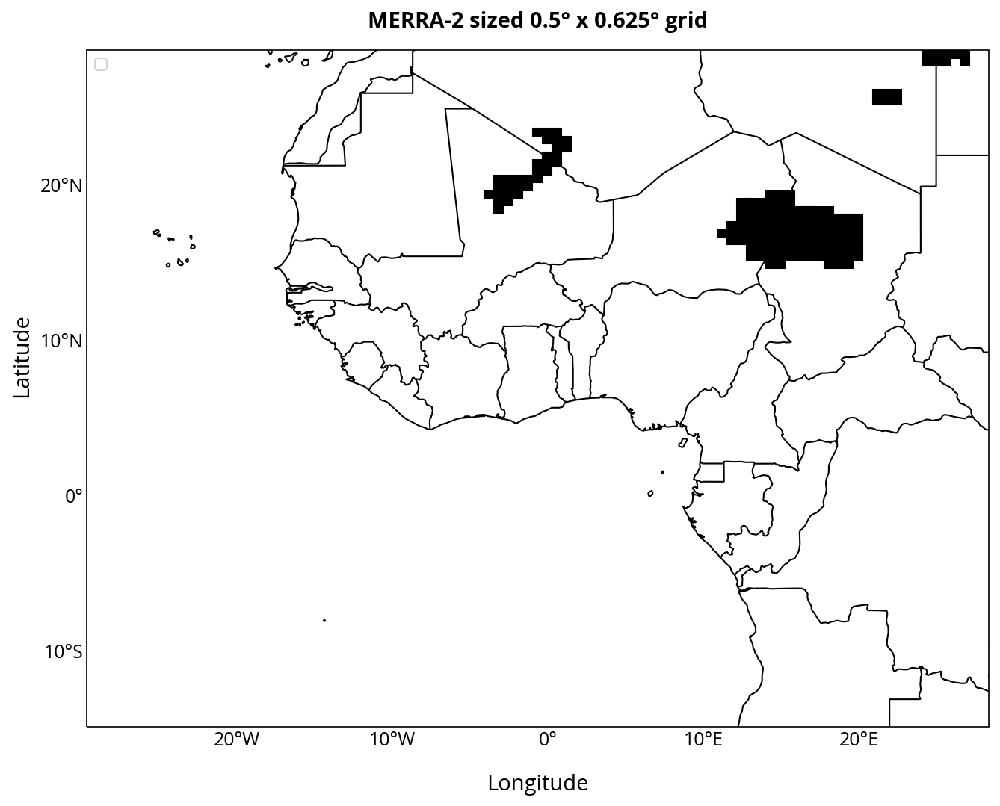

In [8]:
plot_grid(west_africa_latitudes, west_africa_longitudes,
          'MERRA-2 sized 0.5° x 0.625° grid',
          extent=[-30+(.25*1.5),29-(2*.3125),-15+(.3125/1.5),29-.25], borders = True, add_source_region=True, plot_lines=False, plot_grid_lines=False)

#### Figure 8

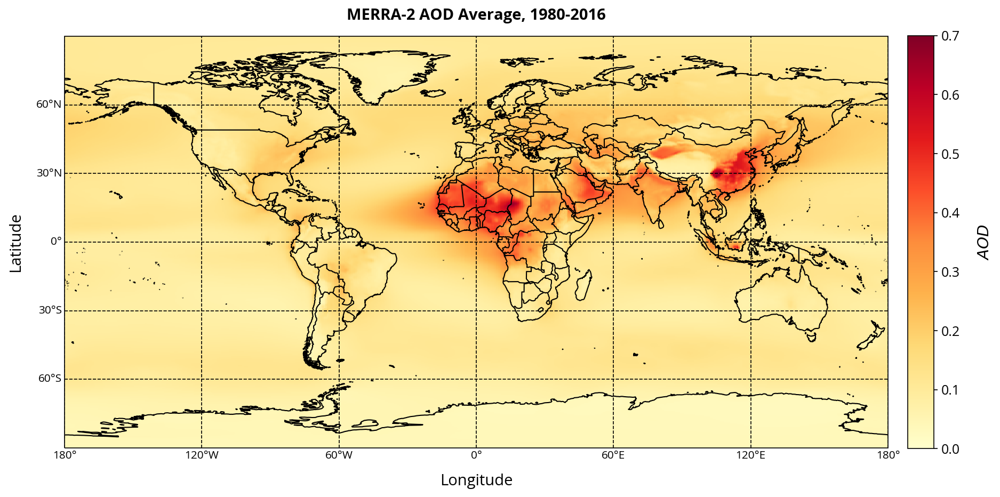

In [9]:
plot_merra_data(np.sum(aod_monthly_data, axis = 0)/aod_monthly_data.shape[0],
                total_longitudes, total_latitudes,'MERRA-2 AOD Average, ', '1980-2016',r'$AOD$',
                extent=[-180, 180, -90, 90], cbar_min = 0, cbar_max = 0.7, plot_grids=True, borders=True, shrink=.855)

#### Figure 1

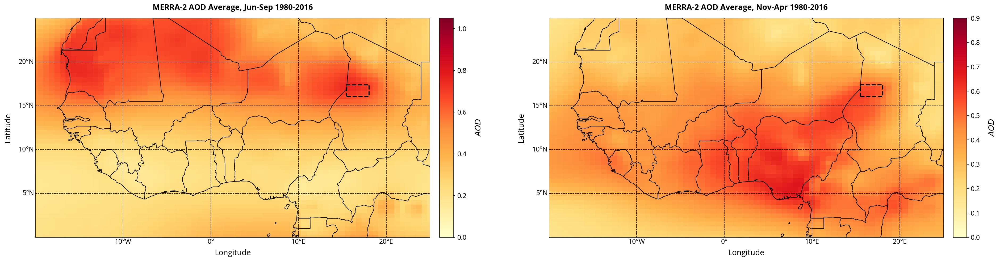

In [10]:
plot_merra_data2([np.sum(aod_monthly_junsep_data, axis = 0)/aod_monthly_junsep_data.shape[0], np.sum(aod_monthly_novapr_data, axis = 0)/aod_monthly_novapr_data.shape[0]],
                    total_longitudes, total_latitudes, titles=['MERRA-2 AOD Average, ', 'MERRA-2 AOD Average, '],
                    date=['Jun-Sep 1980-2016','Nov-Apr 1980-2016'], data_values=[r'$AOD$',r'$AOD$'] , extent=[-20,25,0,25],
                    borders = True, bodele = True, plot_grids = True, add_source_region = False,
                    add_bodele_source_exclusive = False, add_bodele_source_exclusive_alpha = 1,
                    cbar_color = ['YlOrRd','YlOrRd'], cbar_min = [0,0], cbar_max = [1.05,0.9], unit = [1,1], figsize = (32,16), rows = 1, columns = 2, shrink=0.455, labelsize = 14, lat_space = -0.09)

#### $\text{Dust}_{2.5}$ Data

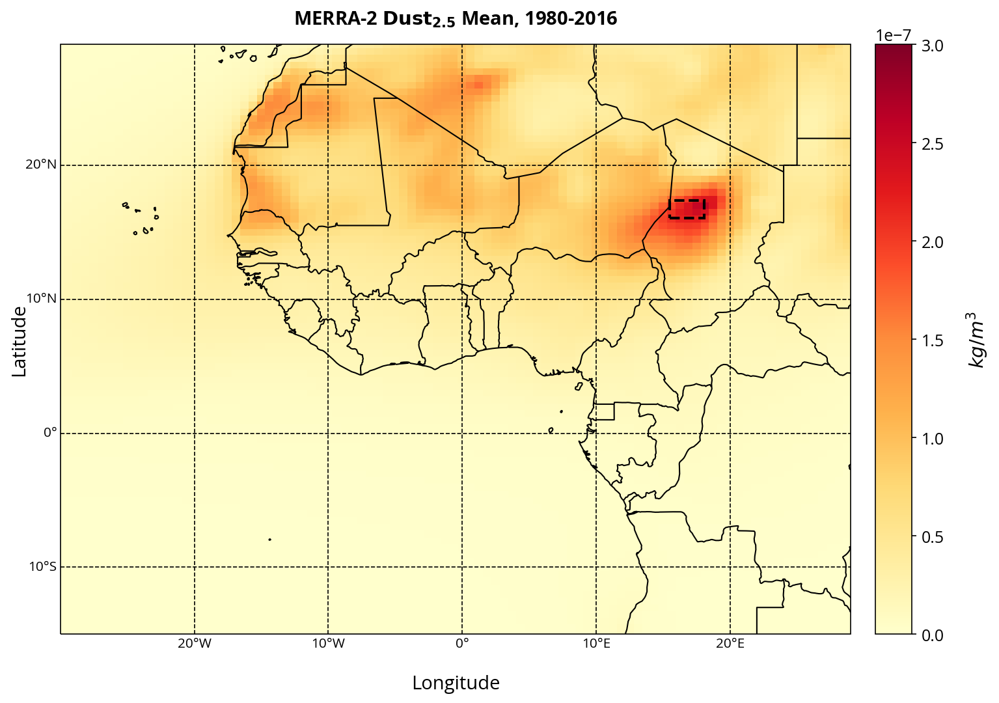

In [11]:
plot_merra_data(np.sum(dust_daily_data, axis = 0)/dust_daily_data.shape[0],
                west_africa_longitudes, west_africa_latitudes, title= r"MERRA-2 $\mathbf{Dust_{2.5}}$ Mean, ",
                date='1980-2016',data_value=r'$kg/m^3$', extent=[-30,29,-15,29], borders = True,
                bodele = True, plot_grids = True, cbar_max = 3, unit = 10 ** -7, shrink=1, ax_text_left=-0.04)

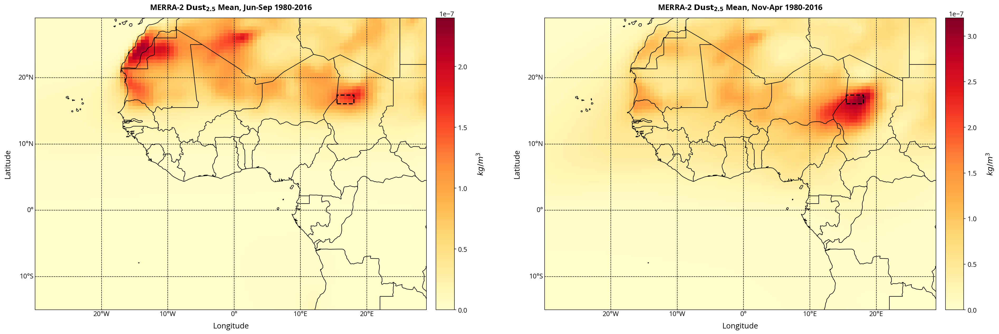

In [12]:
plot_merra_data2([np.sum(dust_daily_data_junsep, axis = 0)/dust_daily_data_junsep.shape[0], np.sum(dust_daily_data_novapr, axis = 0)/dust_daily_data_novapr.shape[0]],
                    west_africa_longitudes, west_africa_latitudes, titles=['MERRA-2 $\mathbf{Dust_{2.5}}$ Mean, ', 'MERRA-2 $\mathbf{Dust_{2.5}}$ Mean, '],
                    date=['Jun-Sep 1980-2016', 'Nov-Apr 1980-2016'], data_values=[r'$kg/m^3$',r'$kg/m^3$'] , extent=[-30,29,-15,29],
                    borders = True, bodele = True, plot_grids = True, add_source_region = False,
                    add_bodele_source_exclusive = False, add_bodele_source_exclusive_alpha = 1,
                    cbar_color = ['YlOrRd','YlOrRd'], cbar_min = [0,0], cbar_max = [2.4,3.2], unit = [10 ** -7,10 ** -7], figsize = (32,16), rows = 1, columns = 2, shrink=0.612, labelsize = 14)

#### $\text{PM}_{2.5}$ Data

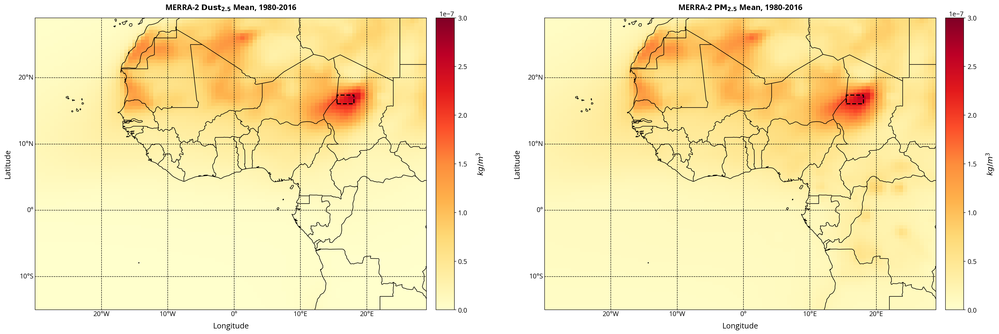

In [13]:
plot_merra_data2([np.sum(dust_daily_data, axis = 0)/dust_daily_data.shape[0], np.sum(pm25_daily_data, axis = 0)/pm25_daily_data.shape[0]],
                    west_africa_longitudes, west_africa_latitudes, titles=['MERRA-2 $\mathbf{Dust_{2.5}}$ Mean, ', 'MERRA-2 $\mathbf{PM_{2.5}}$ Mean, '],
                    date=['1980-2016', '1980-2016'], data_values=[r'$kg/m^3$',r'$kg/m^3$'] , extent=[-30,29,-15,29],
                    borders = True, bodele = True, plot_grids = True, add_source_region = False,
                    add_bodele_source_exclusive = False, add_bodele_source_exclusive_alpha = 1,
                    cbar_color = ['YlOrRd','YlOrRd'], cbar_min = [0,0], cbar_max = [3.0,3.0], unit = [10 ** -7,10 ** -7], figsize = (32,16), rows = 1, columns = 2, shrink=0.612, labelsize = 14)

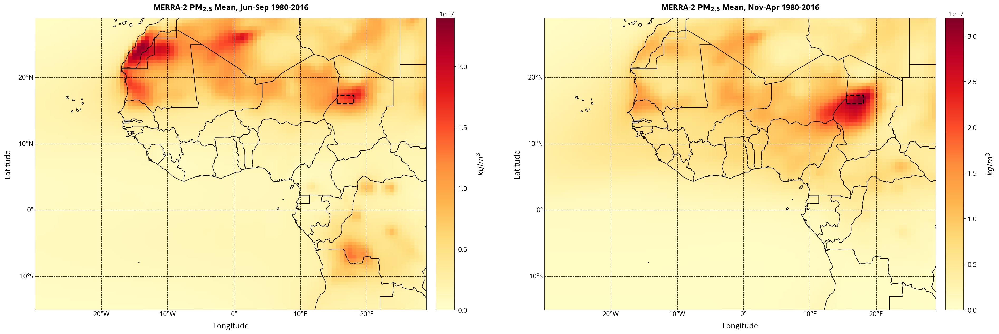

In [14]:
plot_merra_data2([np.sum(pm25_daily_data_junsep, axis = 0)/pm25_daily_data_junsep.shape[0], np.sum(pm25_daily_data_novapr, axis = 0)/pm25_daily_data_novapr.shape[0]],
                    west_africa_longitudes, west_africa_latitudes, titles=['MERRA-2 $\mathbf{PM_{2.5}}$ Mean, ', 'MERRA-2 $\mathbf{PM_{2.5}}$ Mean, '],
                    date=['Jun-Sep 1980-2016', 'Nov-Apr 1980-2016'], data_values=[r'$kg/m^3$',r'$kg/m^3$'] , extent=[-30,29,-15,29],
                    borders = True, bodele = True, plot_grids = True, add_source_region = False,
                    add_bodele_source_exclusive = False, add_bodele_source_exclusive_alpha = 1,
                    cbar_color = ['YlOrRd','YlOrRd'], cbar_min = [0,0], cbar_max = [2.4,3.2], unit = [10 ** -7,10 ** -7], figsize = (32,16), rows = 1, columns = 2, shrink=0.612, labelsize = 14)

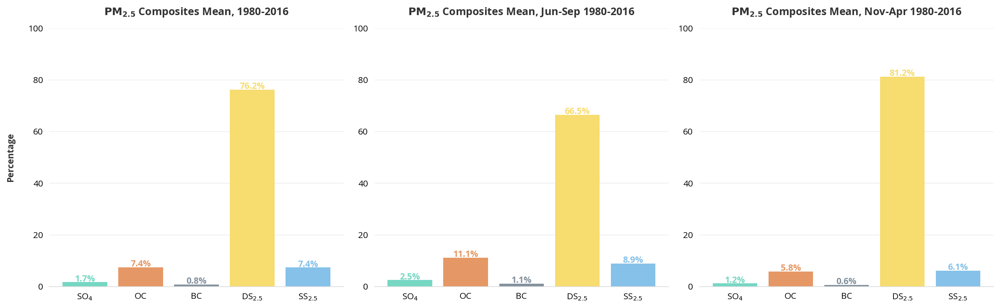

In [15]:
barplot(data = [data_total_df, data_junsep_df, data_novapr_df], columns = 3,
            titles = ['$\mathbf{PM_{2.5}}$ Composites Mean, 1980-2016', '$\mathbf{PM_{2.5}}$ Composites Mean, Jun-Sep 1980-2016', '$\mathbf{PM_{2.5}}$ Composites Mean, Nov-Apr 1980-2016'],
            xlabels = ['PM$_{2.5}$ Composites', 'PM$_{2.5}$ Composites', 'PM$_{2.5}$ Composites'], ylabels=['Percentage', 'Percentage', 'Percentage'],
            bar_colors = ['#76d7c3', '#e59865', '#84929e', '#f7dc6f', '#85c1e9'], figsize = (16,5))


In [16]:
# Use Matplotlib's font manager to rebuild the font library.
import matplotlib as mpl
mpl.font_manager._rebuild()

# Use the newly integrated Roboto font family for all text.
plt.rc('font', family='Open Sans')

def barplot(data, columns, titles = '', xlabels='', ylabels='', bar_colors = ['#76d7c3', '#f0b27a', '#84929e', '#f7dc6f', '#85c1e9'], figsize = (16,9)):
  fig, ax = plt.subplots(1, ncols=columns, figsize = figsize)

  baro = dict()
  # plt.figure(dpi=1200)

  # Save the chart so we can loop through the bars below.

  for idx in range(len(data)):

    baro[idx] = ax[idx].bar(
        x=np.arange(data[idx].size),
        height=data[idx]['value'],
        tick_label=data[idx].index, 
        color = bar_colors
    )

    # Axis formatting.
    ax[idx].spines['top'].set_visible(False)
    ax[idx].spines['right'].set_visible(False)
    ax[idx].spines['left'].set_visible(False)
    ax[idx].spines['bottom'].set_color('#DDDDDD')
    ax[idx].tick_params(bottom=False, left=False)
    ax[idx].set_axisbelow(True)
    ax[idx].yaxis.grid(True, color='#EEEEEE')
    ax[idx].xaxis.grid(False)

    # Add text annotations to the top of the bars.
    # bar_color = bar_colors[idx]
    for bar_idx, bar in enumerate(baro[idx]):
      ax[idx].text(
          bar.get_x() + bar.get_width() / 2,
          bar.get_height() + 0.3,
          str(round(bar.get_height(), 1))+'%',
          horizontalalignment='center',
          color=bar_colors[bar_idx],
          weight='bold'
      )

    ax[idx].set_ylim([0,100])

    # Add labels and a title.
    if(idx is 0):
      ax[idx].set_ylabel(ylabels[idx], labelpad=15, color='#333333', fontsize=10, weight='bold')
    # ax[idx].set_xlabel(xlabels[idx], labelpad=15, color='#333333')
    ax[idx].set_title(titles[idx], pad=15, color='#333333',
                weight='bold')

  fig.tight_layout()


#### Wind Data

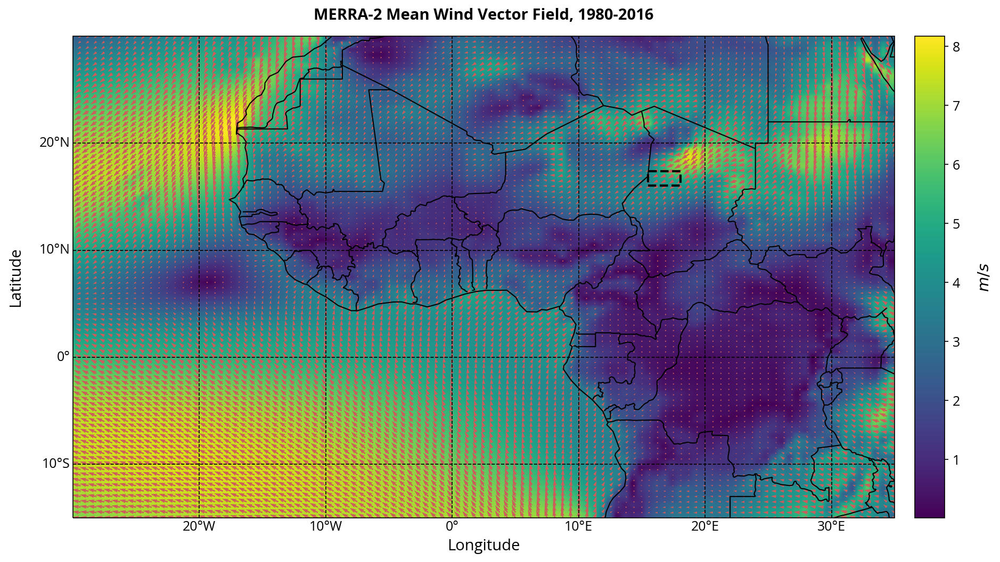

In [17]:
plot_wind_vectorfield(np.sum(wind_eastward_hourly_data, axis = 0)/wind_eastward_hourly_data.shape[0],
                      np.sum(wind_northward_hourly_data, axis = 0)/wind_northward_hourly_data.shape[0],
                      west_africa_longitudes, west_africa_latitudes, fig_size = (16,8),
                      title= 'MERRA-2 Mean Wind Vector Field, ', date='1980-2016', data_value=r'$m/s$', 
                      extent = [-30,35,30,-15], borders = True,
                      bodele = True, interpolation = "hermite")

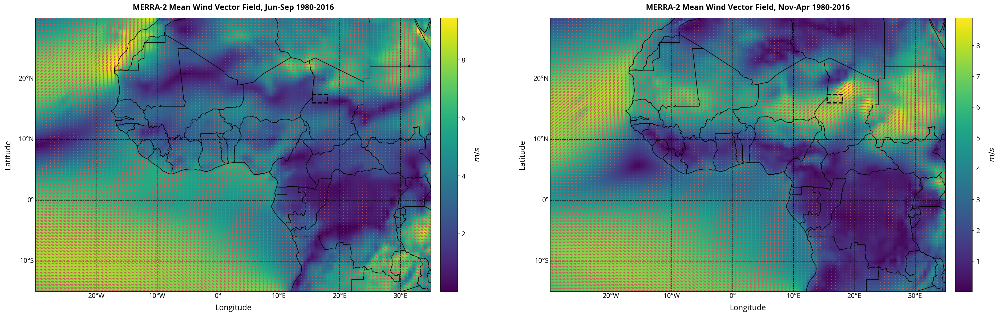

In [18]:
plot_wind_vectorfield2(np.sum(wind_eastward_hourly_junsep_data, axis = 0)/wind_eastward_hourly_junsep_data.shape[0],
                       np.sum(wind_northward_hourly_junsep_data, axis = 0)/wind_northward_hourly_junsep_data.shape[0],
                       west_africa_longitudes, west_africa_latitudes, fig_size = (32,16),
                       title= ['MERRA-2 Mean Wind Vector Field, ', 'MERRA-2 Mean Wind Vector Field, '], date=['Jun-Sep 1980-2016', 'Nov-Apr 1980-2016'], data_value=r'$m/s$', 
                       extent = [-30,35,30,-15], borders = True,
                       bodele = True, interpolation = "hermite",
                       x_winds2=np.sum(wind_eastward_hourly_novapr_data, axis = 0)/wind_eastward_hourly_novapr_data.shape[0],
                       y_winds2=np.sum(wind_northward_hourly_novapr_data, axis = 0)/wind_northward_hourly_novapr_data.shape[0],
                       shrink=0.5675)

#### Temperature and Precipitation Data

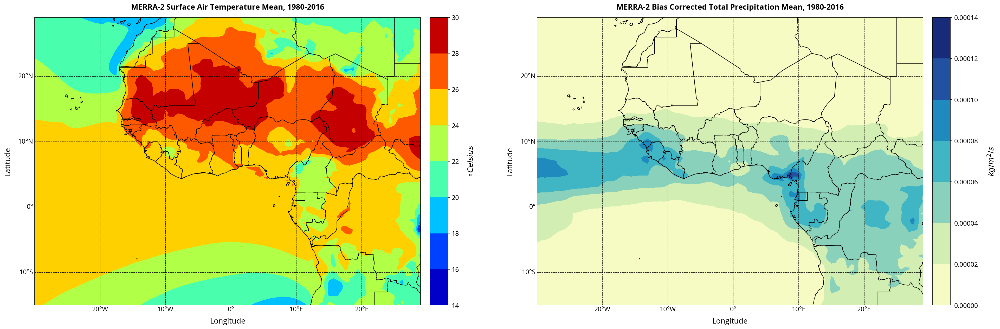

In [19]:
plot_merra_data2([(np.sum(temperature_daily_data, axis = 0)/temperature_daily_data.shape[0])-273.15, np.sum(precipitation_daily_data, axis = 0)/precipitation_daily_data.shape[0]],
                    west_africa_longitudes, west_africa_latitudes, titles=['MERRA-2 Surface Air Temperature Mean, ', 'MERRA-2 Bias Corrected Total Precipitation Mean, '],
                    date=['1980-2016','1980-2016'], data_values=[r'$\circ Celsius$',r'$kg/m^2/s$'] , extent=[-30,29,-15,29],
                    borders = True, bodele = False, plot_grids = False, add_source_region = False,
                    add_bodele_source_exclusive = False, add_bodele_source_exclusive_alpha = 1,
                    cbar_color = ['jet','YlGnBu'], cbar_min = 0, cbar_max = 7, unit = 1, figsize = (32,16), rows = 1, columns = 2, shrink=0.612, labelsize = 14)

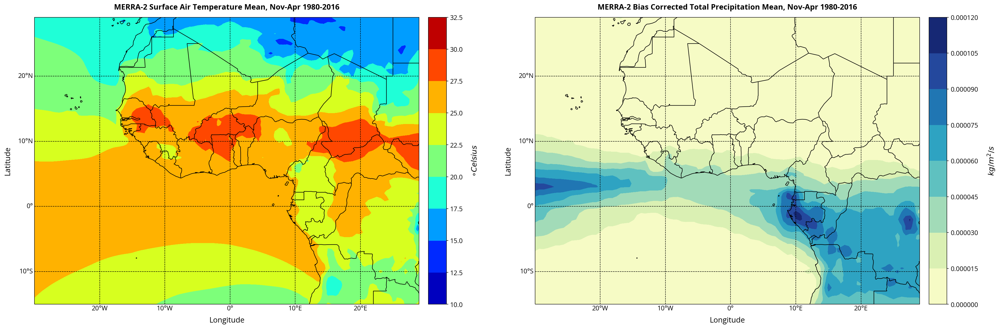

In [20]:
plot_merra_data2([(np.sum(temperature_daily_data_novapr, axis = 0)/temperature_daily_data_novapr.shape[0])-273.15, np.sum(precipitation_daily_data_novapr, axis = 0)/precipitation_daily_data_novapr.shape[0]],
                    west_africa_longitudes, west_africa_latitudes, titles=['MERRA-2 Surface Air Temperature Mean, ', 'MERRA-2 Bias Corrected Total Precipitation Mean, '],
                    date=['Nov-Apr 1980-2016','Nov-Apr 1980-2016'], data_values=[r'$\circ Celsius$',r'$kg/m^2/s$'] , extent=[-30,29,-15,29],
                    borders = True, bodele = False, plot_grids = False, add_source_region = False,
                    add_bodele_source_exclusive = False, add_bodele_source_exclusive_alpha = 1,
                    cbar_color = ['jet','YlGnBu'], cbar_min = 0, cbar_max = 7, unit = 1, figsize = (32,16), rows = 1, columns = 2, shrink=0.612, labelsize = 14)

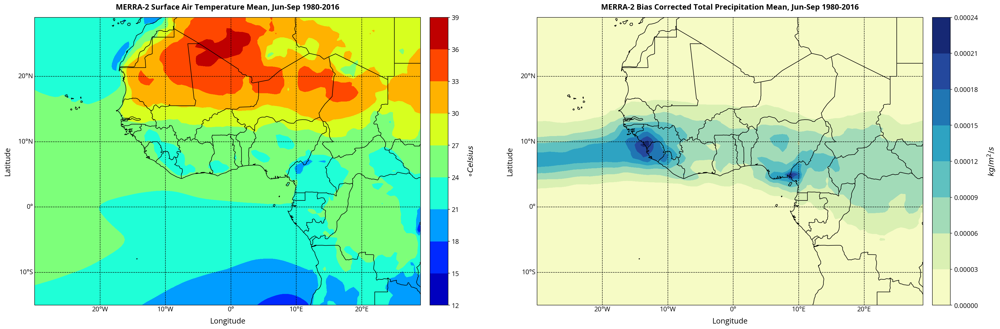

In [21]:
plot_merra_data2([(np.sum(temperature_daily_data_junsep, axis = 0)/temperature_daily_data_junsep.shape[0])-273.15, np.sum(precipitation_daily_data_junsep, axis = 0)/precipitation_daily_data_junsep.shape[0]],
                    west_africa_longitudes, west_africa_latitudes, titles=['MERRA-2 Surface Air Temperature Mean, ', 'MERRA-2 Bias Corrected Total Precipitation Mean, '],
                    date=['Jun-Sep 1980-2016','Jun-Sep 1980-2016'], data_values=[r'$\circ Celsius$',r'$kg/m^2/s$'] , extent=[-30,29,-15,29],
                    borders = True, bodele = False, plot_grids = False, add_source_region = False,
                    add_bodele_source_exclusive = False, add_bodele_source_exclusive_alpha = 1,
                    cbar_color = ['jet','YlGnBu'], cbar_min = 0, cbar_max = 7, unit = 1, figsize = (32,16), rows = 1, columns = 2, shrink=0.612, labelsize = 14)

c:\Users\Daniel\anaconda3\envs\bachelor_econ\lib\site-packages\numpy\core\_methods.py:43: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\Daniel\anaconda3\envs\bachelor_econ\lib\site-packages\numpy\core\_methods.py:39: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
c:\Users\Daniel\anaconda3\envs\bachelor_econ\lib\site-packages\numpy\core\_methods.py:43: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
c:\Users\Daniel\anaconda3\envs\bachelor_econ\lib\site-packages\numpy\core\_methods.py:39: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


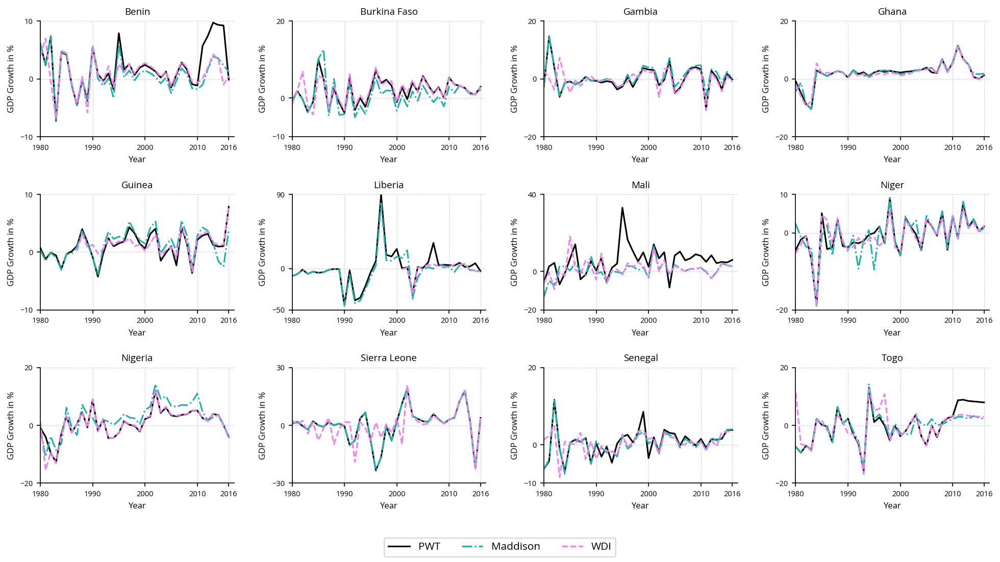

In [22]:
plot_outcome_data(df_pwt_growth_per_cap.copy(), df_mpd_per_cap_growth.copy(), df_wbdi_per_cap_growth.copy(),
                  xlim = [1980, 2017], xticks = [1980,1990,2000,2010,2016],
                  xlabel = 'Year', ylabel = 'GDP Growth in %')

#title='GDP per Capita Growth Comparison for West African Countries'

c:\Users\Daniel\Desktop\Bachelor_thesis\new_topic\Code\functions.py:1292: UserWarning: FixedFormatter should only be used together with FixedLocator
  cb.ax.set_yticklabels(['no data', '0.2', '0.4', '0.6', '0.8',r'$\geq 1$'])


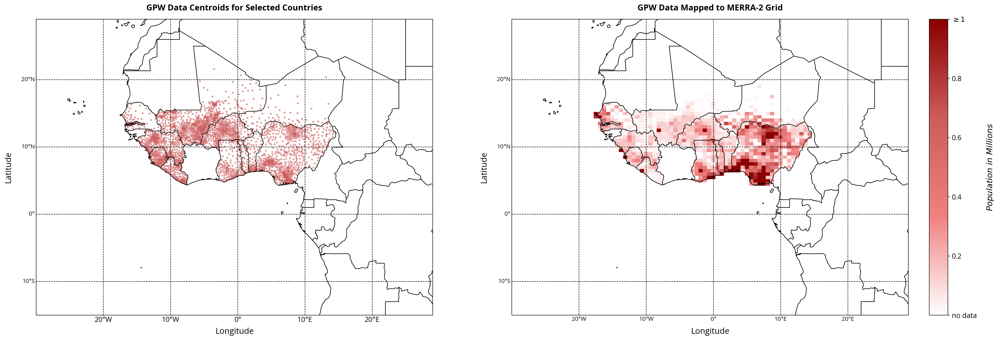

In [23]:
# from functions import plot_gpw_data
plot_gpw_data(population_array, west_africa_latitudes, west_africa_longitudes,
              extent=[-30,29,-15,29], borders = True,
              population_data = [benin_population_df, burkina_faso_population_df, gambia_population_df,
              ghana_population_df, guinea_population_df, liberia_population_df,
              mali_population_df, niger_population_df, nigeria_population_df,
              sierra_leone_population_df, senegal_population_df, togo_population_df], figsize= (32,16), shrink=.578, labelsize = 14, cmap=mpl.colors.LinearSegmentedColormap.from_list("", ["white","lightcoral","indianred","darkred"]))